In [1]:
import numpy as np
from keras.applications.vgg16 import VGG16
import keras
from keras.layers import Conv2D, MaxPool2D, Dropout, Flatten, Dense, Activation, Dropout
from keras.optimizers import Adam
from keras.preprocessing import image
from keras.models import Sequential, Model
from keras.utils import to_categorical
import matplotlib.pyplot as plt

%matplotlib inline

Using Theano backend.
WARNING (theano.sandbox.cuda): The cuda backend is deprecated and will be removed in the next release (v0.10).  Please switch to the gpuarray backend. You can get more information about how to switch at this URL:
 https://github.com/Theano/Theano/wiki/Converting-to-the-new-gpu-back-end%28gpuarray%29

Using gpu device 0: GeForce GTX 1060 6GB (CNMeM is disabled, cuDNN 5110)


In [2]:
data = np.load("./data.npy")
labels = np.load("./labels.npy")

print data.shape
print labels.shape

(12500L, 224L, 224L, 3L)
(12500L,)


In [3]:
labels = to_categorical(labels)
print labels.shape

(12500L, 2L)


In [4]:
def preprocess_input(image):
    image = image[:, :, :, ::-1] #RGB to BGR
    image[:, :, :, 0] -= 103.939 
    image[:, :, :, 1] -= 116.779
    image[:, :, :, 2] -= 123.68
    return image

data = preprocess_input(data)

In [5]:
split = int(0.80 * data.shape[0])
x_train = data[:split, :, :, :]
x_test = data[split:, :, :, :]

y_train = labels[:split]
y_test = labels[split:]

print x_train.shape, y_train.shape
print x_test.shape, y_test.shape

(10000L, 224L, 224L, 3L) (10000L, 2L)
(2500L, 224L, 224L, 3L) (2500L, 2L)


In [6]:
base_model = VGG16(include_top=False, weights='imagenet', input_shape=(224,224,3))

In [7]:
x = Flatten()(base_model.output)
x = Dense(512)(x)
x = Dropout(0.5)(x)
x = Activation('relu')(x)
x = Dense(2)(x)
x = Activation('softmax')(x)

model = Model(inputs=base_model.input, outputs=x)

adam = Adam(lr=0.00003)
model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [8]:
for ix in range(len(model.layers)):
    print ix, model.layers[ix]

0 <keras.engine.topology.InputLayer object at 0x00000000027BFFD0>
1 <keras.layers.convolutional.Conv2D object at 0x000000001AEA2550>
2 <keras.layers.convolutional.Conv2D object at 0x000000001AEA25C0>
3 <keras.layers.pooling.MaxPooling2D object at 0x000000001B1E02B0>
4 <keras.layers.convolutional.Conv2D object at 0x000000001B271E48>
5 <keras.layers.convolutional.Conv2D object at 0x000000001B2F6FD0>
6 <keras.layers.pooling.MaxPooling2D object at 0x000000001B39AB70>
7 <keras.layers.convolutional.Conv2D object at 0x000000001B42E4E0>
8 <keras.layers.convolutional.Conv2D object at 0x000000001B42EDA0>
9 <keras.layers.convolutional.Conv2D object at 0x000000001B511588>
10 <keras.layers.pooling.MaxPooling2D object at 0x00000000027EB2E8>
11 <keras.layers.convolutional.Conv2D object at 0x000000001D073B00>
12 <keras.layers.convolutional.Conv2D object at 0x000000001D073828>
13 <keras.layers.convolutional.Conv2D object at 0x000000001B588160>
14 <keras.layers.pooling.MaxPooling2D object at 0x000000001

In [9]:
for ix in range(19):
    model.layers[ix].trainable = False

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [14]:
hist = model.fit(x_train, y_train, shuffle=True, batch_size=16, epochs=2, validation_data=(x_test, y_test))

Train on 10000 samples, validate on 2500 samples
Epoch 1/2
10000/10000 [==============================] - 973s - loss: 0.3473 - acc: 0.9178 - val_loss: 0.2836 - val_acc: 0.8836
Epoch 2/2
10000/10000 [==============================] - 964s - loss: 0.0712 - acc: 0.9728 - val_loss: 0.1895 - val_acc: 0.9300


In [15]:
model.save_weights("./bottleneck.h5")

In [10]:
model.layers

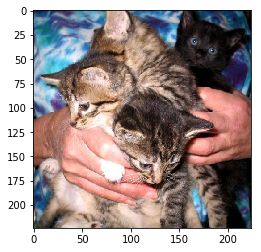

In [15]:
plt.figure(0)
plt.imshow(x_train[500])
plt.show()

In [11]:
first_block = Model(inputs=model.input, outputs=model.layers[2].output)
first_block.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
Total params: 38,720.0
Trainable params: 0.0
Non-trainable params: 38,720.0
_________________________________________________________________


In [12]:
out = first_block.predict(x_train[500, :, :, :].reshape((-1, 224, 224, 3)))
print out.shape

plt.figure(figsize=(224,224))
for ix in range(out.shape[3]):
    plt.subplot(8, 8, ix+1)
    plt.axis('off')
    plt.imshow(out[:, :, :, ix].reshape((224, 224)))
plt.show()

(1L, 224L, 224L, 64L)


In [13]:
second_last_block = Model(inputs=model.input, outputs=model.layers[13].output)
second_last_block.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

(1L, 28L, 28L, 512L)


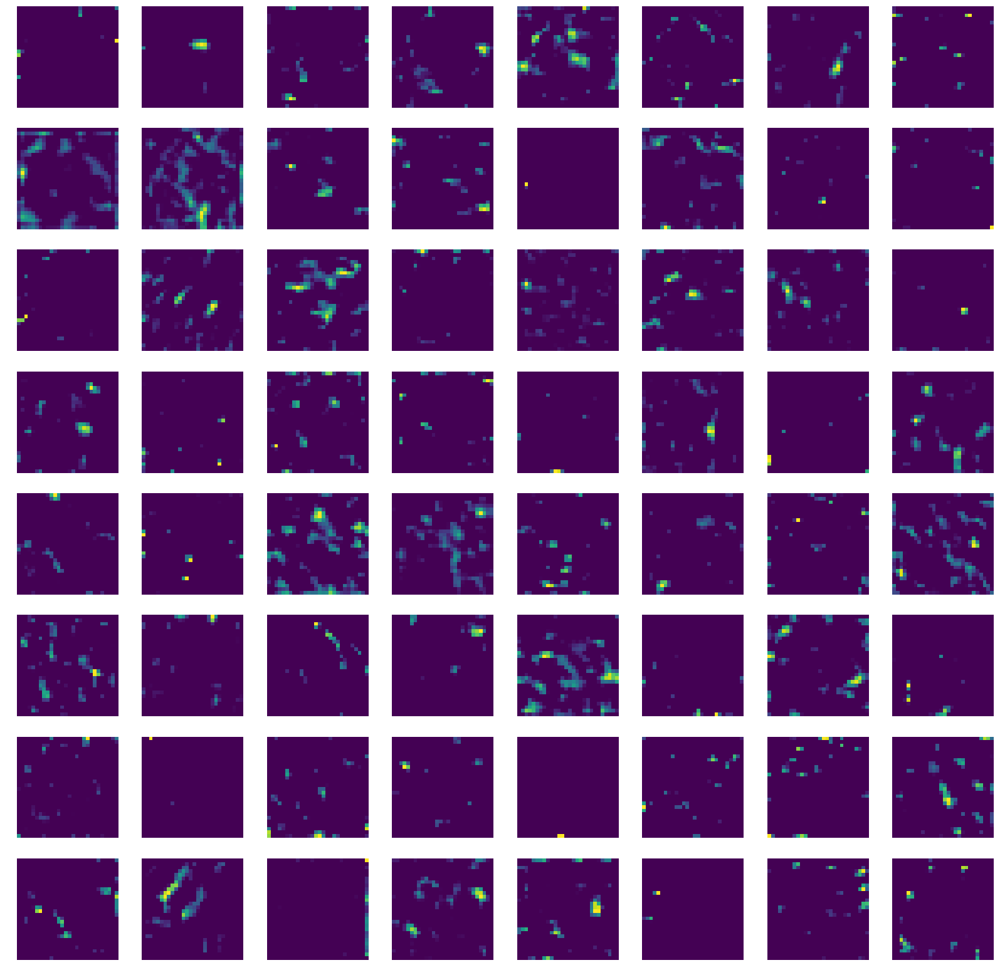

In [16]:
out = second_last_block.predict(x_train[500, :, :, :].reshape((-1, 224, 224, 3)))
print out.shape

plt.figure(figsize=(28,28))
for ix in range(out.shape[3]/8):
    plt.subplot(8, 8, ix+1)
    plt.axis('off')
    plt.imshow(out[:, :, :, ix].reshape((28, 28)))
plt.show()

In [15]:
last_block = Model(inputs=model.input, outputs=model.layers[17].output)
last_block.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

(1L, 14L, 14L, 512L)


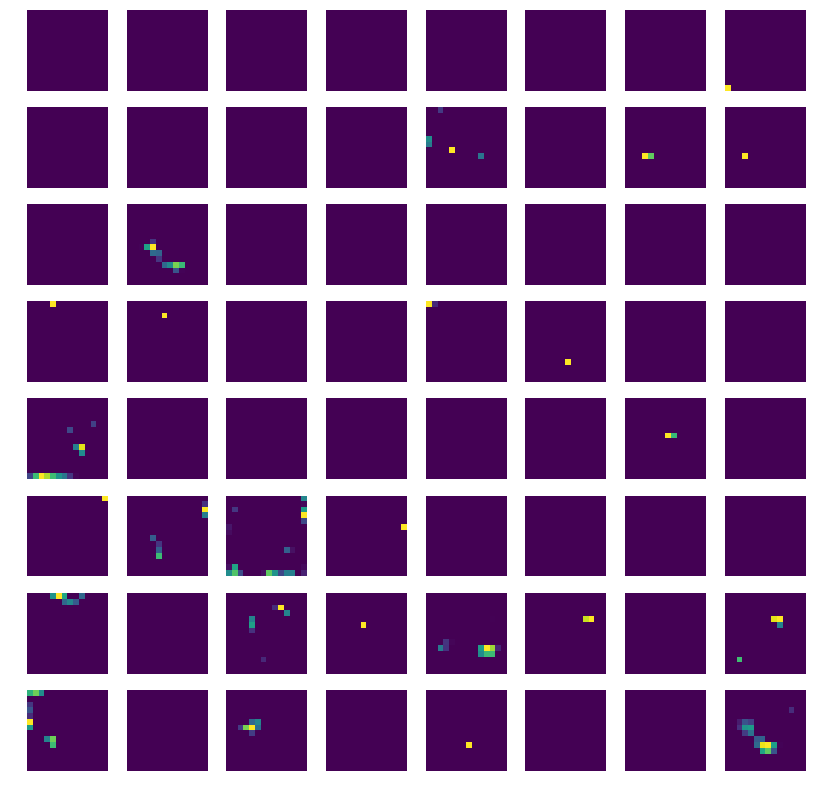

In [22]:
out = last_block.predict(x_train[500, :, :, :].reshape((-1, 224, 224, 3)))
print out.shape

plt.figure(figsize=(14,14))
for ix in range(out.shape[3]/8):
    plt.subplot(8, 8, ix+1)
    plt.axis('off')
    plt.imshow(out[:, :, :, ix].reshape((14, 14)))
plt.show()

In [23]:
#Visualizing first 484 filters of the last Convolution Block

![Visulization_of_last_conv_layer](./bottleneck_last_layer_viz.png)